In [110]:
import os
import numpy as np
import pandas as pd
import dataframe_image as dfi

from tqdm import tqdm
import pickle
import warnings
warnings.filterwarnings('ignore')

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#tools/metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import train_test_split
import shap

#modeling
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

#pandas show all columns
pd.set_option('display.max_columns', None)


In [31]:
master_table = pd.read_csv(r'C:\Users\KY PHUOC\Downloads\master_table.csv')

In [32]:
master_table.head()

,Rank,Player,Age,Tm,First,Pts Won,Pts Max,Share,G,MP,PTS,TRB,AST,STL,BLK,FG%,3P%,FT%,WS,WS/48,year,team,W,W/L%,seed,player_efficiency_rating,true_shooting_percentage,three_point_attempt_rate,free_throw_attempt_rate,offensive_rebound_percentage,defensive_rebound_percentage,total_rebound_percentage,assist_percentage,steal_percentage,block_percentage,turnover_percentage,usage_percentage,offensive_win_shares,defensive_win_shares,win_shares,win_shares_per_48_minutes,offensive_box_plus_minus,defensive_box_plus_minus,box_plus_minus,value_over_replacement_player
0,1,Kareem Abdul-Jabbar,32,LAL,147.0,147.0,221,0.665,82,38.3,24.8,10.8,4.5,1.0,3.4,0.604,0.000,0.765,14.8,0.227,1980,Los Angeles Lakers,60.0,0.732,1.0,25.3,0.639,0.001,0.344,7.2,22.2,15.4,16.5,1.2,4.6,15.7,24.1,9.5,5.3,14.8,0.227,4.8,2.4,7.2,7.3
1,2,Julius Erving,29,PHI,31.5,31.5,221,0.143,78,36.1,26.9,7.4,4.6,2.2,1.8,0.519,0.200,0.787,12.5,0.213,1980,Philadelphia 76ers,59.0,0.720,2.0,25.4,0.568,0.012,0.331,8.6,12.9,10.9,21.4,2.8,2.7,13.3,30.3,7.3,5.2,12.5,0.213,5.7,1.9,7.6,6.8
2,3,George Gervin,27,SAS,19.0,19.0,221,0.086,78,37.6,33.1,5.2,2.6,1.4,1.0,0.528,0.314,0.852,10.6,0.173,1980,San Antonio Spurs,41.0,0.500,4.5,24.0,0.587,0.053,0.306,5.7,8.9,7.3,11.0,1.6,1.4,10.3,31.7,9.3,1.3,10.6,0.173,5.5,-1.6,3.9,4.4
3,4,Larry Bird,23,BOS,15.0,15.0,221,0.068,82,36.0,21.3,10.4,4.5,1.7,0.6,0.474,0.406,0.836,11.2,0.182,1980,Boston Celtics,61.0,0.744,1.0,20.5,0.538,0.098,0.246,8.3,23.6,16.0,18.5,2.3,1.0,14.0,25.3,5.6,5.6,11.2,0.182,3.0,1.5,4.5,4.8
4,5T,Tiny Archibald,31,BOS,2.0,2.0,221,0.009,80,35.8,14.1,2.5,8.4,1.3,0.1,0.482,0.222,0.830,8.9,0.148,1980,Boston Celtics,61.0,0.744,1.0,15.3,0.574,0.023,0.548,2.3,5.3,3.8,30.2,1.7,0.2,19.7,17.0,5.9,2.9,8.9,0.148,1.4,-0.3,1.1,2.3


In [33]:
corr_matrix = master_table.corr()
corr_matrix

,Age,First,Pts Won,Pts Max,Share,G,MP,PTS,TRB,AST,STL,BLK,FG%,3P%,FT%,WS,WS/48,year,W,W/L%,seed,player_efficiency_rating,true_shooting_percentage,three_point_attempt_rate,free_throw_attempt_rate,offensive_rebound_percentage,defensive_rebound_percentage,total_rebound_percentage,assist_percentage,steal_percentage,block_percentage,turnover_percentage,usage_percentage,offensive_win_shares,defensive_win_shares,win_shares,win_shares_per_48_minutes,offensive_box_plus_minus,defensive_box_plus_minus,box_plus_minus,value_over_replacement_player
Age,1.000000,0.013607,-0.005857,0.044976,-0.001800,-0.109013,-0.286152,-0.157313,-0.037564,-0.031203,-0.249046,0.013697,0.031468,0.004314,0.120233,-0.083403,0.031622,0.031027,0.140918,0.173986,-0.155730,-0.036805,0.078398,0.030232,-0.090980,-0.048177,0.057585,0.030974,0.014471,-0.186804,0.027065,0.008664,-0.080963,-0.049172,-0.090155,-0.084451,0.031622,-0.010701,-0.005785,-0.012022,-0.090716
First,0.013607,1.000000,0.803331,0.040807,0.812318,0.093180,0.129762,0.284105,0.107276,0.107245,0.074917,0.073242,0.108039,0.052171,0.064523,0.463704,0.448682,0.074560,0.277256,0.306826,-0.259443,0.419043,0.183235,0.067985,0.035902,-0.008739,0.105681,0.080040,0.135065,0.060183,0.058982,-0.063566,0.238772,0.397038,0.239355,0.463006,0.448682,0.397465,0.241275,0.442612,0.466534
Pts Won,-0.005857,0.803331,1.000000,0.181794,0.977362,0.093092,0.204806,0.411467,0.163513,0.126555,0.101631,0.116377,0.119273,0.068280,0.042663,0.601738,0.592536,0.187736,0.308594,0.346089,-0.309971,0.594346,0.236326,0.111096,0.140501,-0.007726,0.174582,0.129271,0.171959,0.083531,0.118068,-0.103700,0.376307,0.511147,0.320195,0.600995,0.592536,0.536062,0.316902,0.592773,0.613035
Pts Max,0.044976,0.040807,0.181794,1.000000,0.078242,-0.195938,0.133983,0.037536,-0.022537,0.062841,-0.074144,-0.031335,-0.271296,0.299816,0.011215,0.133355,0.209757,0.758465,0.025603,0.095326,0.081943,0.264975,-0.044386,0.397360,0.027954,-0.240341,0.116332,-0.004741,0.196747,-0.008628,0.080604,-0.168754,0.231420,0.130558,0.039296,0.134588,0.209757,0.221495,0.120393,0.240675,0.187982
Share,-0.001800,0.812318,0.977362,0.078242,1.000000,0.110165,0.213530,0.432432,0.188887,0.130440,0.126365,0.133683,0.154296,0.040934,0.059078,0.619349,0.600351,0.111664,0.317717,0.350305,-0.323283,0.599861,0.256370,0.072720,0.139632,0.025482,0.182973,0.148116,0.158710,0.096360,0.119449,-0.092862,0.366847,0.523072,0.335714,0.618586,0.600351,0.542630,0.328301,0.603894,0.631312
G,-0.109013,0.093180,0.093092,-0.195938,0.110165,1.000000,0.161846,0.045794,-0.010073,-0.005788,0.080102,0.014913,0.101077,-0.066593,0.103812,0.450040,0.015843,-0.249075,0.273152,0.024611,-0.081402,-0.065436,0.083753,-0.094996,-0.053729,0.020787,-0.078127,-0.048485,-0.077911,0.030265,-0.049418,-0.007858,-0.114973,0.340362,0.315775,0.448265,0.015843,-0.021985,-0.034260,-0.035257,0.290036
MP,-0.286152,0.129762,0.204806,0.133983,0.213530,0.161846,1.000000,0.493026,0.161027,0.116848,0.311414,-0.012619,-0.153524,0.113354,-0.025087,0.376942,0.066670,-0.053224,-0.165904,-0.229752,0.228900,0.202873,-0.126513,0.027293,0.059990,-0.028133,-0.013819,-0.024796,0.035151,0.141930,-0.096238,-0.189946,0.252851,0.324787,0.199989,0.380266,0.066670,0.255830,-0.036665,0.189099,0.392910
PTS,-0.157313,0.284105,0.411467,0.037536,0.432432,0.045794,0.493026,1.000000,0.070963,-0.075884,0.104242,-0.004307,0.031899,0.176816,0.188762,0.477712,0.398466,0.158029,-0.077836,-0.125891,0.109434,0.699848,0.234700,0.143209,0.139030,-0.099099,0.003333,-0.034550,-0.028923,-0.009229,-0.030025,-0.557481,0.878623,0.551634,-0.022804,0.479951,0.398466,0.654092,-0.119754,0.468109,0.515272
TRB,-0.037564,0.107276,0.163513,-0.022537,0.188887,-0.010073,0.161027,0.070963,1.000000,-0.516142,-0.293393,0.659294,0.415783,-0.402675,-0.506775,0.216023,0.211932,-0.016217,-0.017219,-0.019880,0.047512,0.253462,0.077953,-0.414629,0.383550,0.827220,0.938847,0.974551,-0.539868,-0.344540,0.641228,-0.026656,-0.016084,-0.060810,0.591618,0.215611,0.211932,-0.109753,0.348913,0.0850

In [34]:
ones_corr = np.ones_like(corr_matrix, dtype=bool)

In [35]:
ones_corr

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [36]:
mask = np.triu(ones_corr)

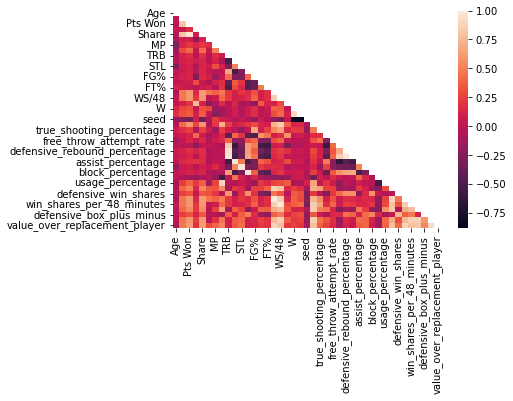

In [37]:
sns.heatmap(data=corr_matrix, mask=mask);

In [38]:
adjusted_mask = mask[1:, :-1]
adjusted_mask
adjusted_corr_matrix = corr_matrix.iloc[1:, :-1]

In [39]:
fig, ax = plt.subplots(figsize=(150,100))


#That method uses HUSL colors, so you need hue, saturation, and lightness. 
#I used hsluv.org to select the colors of this chart.
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

ax = sns.heatmap(data=adjusted_corr_matrix, mask=adjusted_mask,
            annot=True, annot_kws={"fontsize":50}, fmt=".2f", cmap=cmap,
            vmin=-1, vmax=1,
            linecolor='white', linewidths=1);
ax.collections[0].colorbar.ax.tick_params(labelsize= 50)

yticks = [i.upper() for i in adjusted_corr_matrix.index]
xticks = [i.upper() for i in adjusted_corr_matrix.columns]

ax.set_yticklabels(yticks, rotation=0, fontsize=50);
ax.set_xticklabels(xticks, rotation=90, fontsize=50);
title = 'CORRELATION MATRIX\nSAMPLED CEREALS COMPOSITION\n'
ax.set_title(title, loc='left', fontsize=18);

In [40]:
def calculate_ml_scores(df):
    X = df.copy()
    y = X["Share"]

    X.drop('Share', axis=1, inplace=True)

    # Label encoding for categoricals
    for colname in X.select_dtypes("object"):
        X[colname], _ = X[colname].factorize()

    # All discrete features should now have integer dtypes (double-check this before using MI!)
    discrete_features = X.dtypes == int
    
    mi_scores = mutual_info_regression(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return X, y, mi_scores

In [41]:
to_drop_mi = ['Rank','Player','Age','year','Tm','team','First','Pts Won','Pts Max','WS','WS/48']
master_table_mi = master_table.copy()
master_table_mi.drop(to_drop_mi, axis=1, inplace=True)

In [42]:
X, y, mi_scores = calculate_ml_scores(df=master_table_mi)

In [43]:
mi_scores

win_shares                       0.293192
win_shares_per_48_minutes        0.267151
player_efficiency_rating         0.266862
value_over_replacement_player    0.246739
box_plus_minus                   0.215492
offensive_box_plus_minus         0.209106
offensive_win_shares             0.197342
PTS                              0.156023
usage_percentage                 0.121569
W/L%                             0.119604
seed                             0.118696
W                                0.090172
true_shooting_percentage         0.089172
defensive_rebound_percentage     0.082994
free_throw_attempt_rate          0.074415
defensive_win_shares             0.069083
MP                               0.068997
TRB                              0.056310
defensive_box_plus_minus         0.048095
STL                              0.043488
assist_percentage                0.041504
FT%                              0.022455
FG%                              0.019947
AST                              0

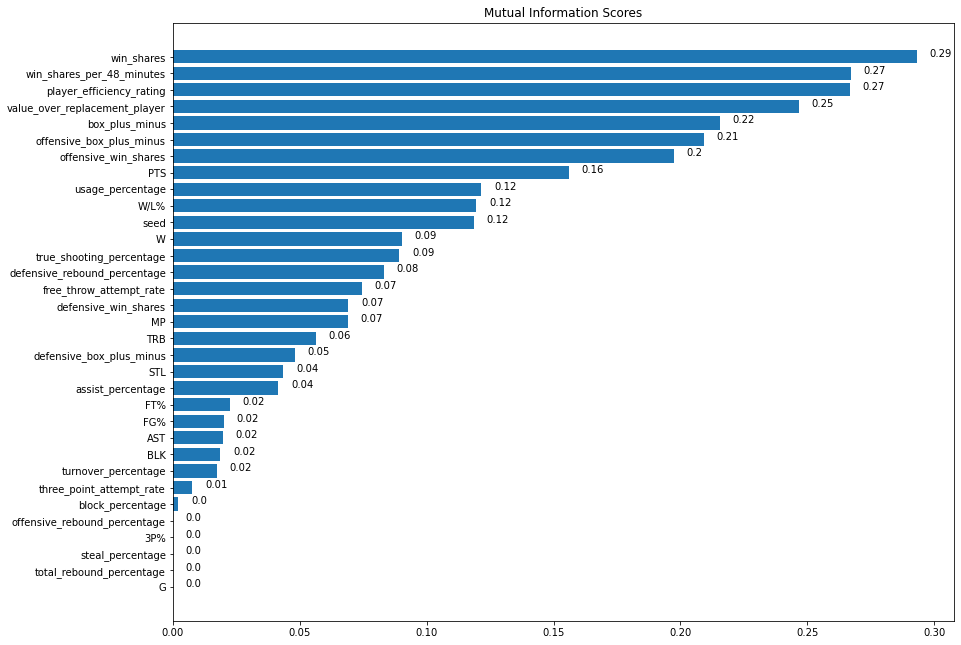

In [44]:
def plot_mi_scores(scores, figsize):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.barh(width, scores)
    
    for index, value in enumerate(scores):
        plt.text(value +0.005 , index, str(round(value,2)))
    
    plt.yticks(width, ticks)    
    plt.title("Mutual Information Scores")

plot_mi_scores(mi_scores, figsize=(14,11))

In [45]:
def add_win_lose_col(df):
    rank_lst = []
    for i in list(df['Rank']):
        if i == '1':
            rank_lst.append('won')
        else:
            rank_lst.append('lost')
    master_table_rank = df.copy()
    master_table_rank['Win/Lose'] = rank_lst
    return master_table_rank

In [46]:
def show_feature_vs_share(feature, df):
    fig = px.scatter(data_frame = df,
               x=feature,
               y='Share',
               color='Win/Lose',
               color_discrete_sequence=['blue','gray'], 
               hover_data={
                   'Win/Lose': False,
                   'Player': True, 
                   'year': True,
                   'seed': True,
                   'W/L%': True, 
                   'W': True
                   
               })
    fig.update_layout(height=500,
                     title = f"{feature} vs. MVP share")
    fig.show()

In [47]:
features = ['win_shares', 
            'player_efficiency_rating',
            'value_over_replacement_player',
            'box_plus_minus',
            'offensive_box_plus_minus',
            'usage_percentage',
            'seed',
            'W',
            'W/L%',
            'PTS']

master_table_rank = add_win_lose_col(df=master_table)

for feature in features:
    show_feature_vs_share(feature=feature, df=master_table_rank)

In [48]:
to_drop = [
    'Rank',
    'Player',
    'Age',
    'year',
    'Tm',
    'team',
    'First',
    'Pts Won',
    'Pts Max',
    'WS/48',
    'WS',
    'MP',
    'G',
    'W', 
    'FG%',
    '3P%',
    'STL', 
    'BLK',
    'three_point_attempt_rate',
    'total_rebound_percentage',
    'offensive_rebound_percentage',
    'block_percentage',
    'defensive_rebound_percentage',
    'steal_percentage',
    'turnover_percentage',
    'assist_percentage',
    'AST',
    'TRB',
    #'free_throw_attempt_rate', ######### Experiment
    'FT%',
    'win_shares', 
    #'value_over_replacement_player', 
    'box_plus_minus', 
    #'offensive_box_plus_minus', 
    'defensive_box_plus_minus',
    'offensive_win_shares', 
    'defensive_win_shares', 
    'true_shooting_percentage' 
]

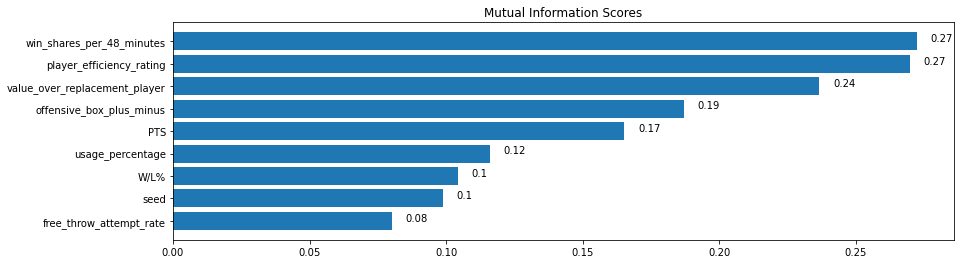

In [49]:
master_table_mi2 = master_table.copy()
master_table_mi2.drop(to_drop, axis=1, inplace=True)
X, y, mi_scores2 = calculate_ml_scores(df=master_table_mi2)
plot_mi_scores(mi_scores2, figsize=(14,4))

NameError: name 'df' is not defined

# Modeling
## Train/Test Split

In [88]:
def train_test_split_by_year(year, df, scaling=False):
    #test year = selected year, train year = other years outside of selected year
    train_df = df[df['year'] != year]
    test_df = df[df['year'] == year]
    
    train_df2 = train_df.copy()
    test_df2 = test_df.copy()
    
    train_df2.drop(to_drop, axis=1, inplace=True)
    test_df2.drop(to_drop, axis=1, inplace=True)
    
    if scaling == True:
        sc_X = StandardScaler()
        sc_y = StandardScaler()
        train_df2 = sc_X.fit_transform(train_df2)
        test_df2 = sc_y.fit_transform(test_df2)
    
    X_train = train_df2.copy()
    y_train = X_train["Share"]
    
    X_test = test_df2.copy()
    y_test = X_test["Share"]

    X_train.drop('Share', axis=1, inplace=True)
    cols = X_train.columns
    X_test.drop('Share', axis=1, inplace=True)

    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)
    
    return X_train, y_train, X_test, y_test, cols

In [89]:
def run_model(regressor, X_train, y_train, X_test, y_test, df, year):
    model = regressor
    model.fit(X_train, y_train) 
    predictions = model.predict(X_test)
    mae = mean_absolute_error(predictions, y_test)
    r2 = r2_score(y_test, predictions)
    
    mvp_race = df[df['year'] == year]
    mvp_race['predicted_share'] = predictions
    mvp_race = mvp_race.sort_values(["Share", "predicted_share"], ascending = (False, False))
                                    
    actual_winner = mvp_race[mvp_race['Share'] == mvp_race['Share'].max()]['Player']
    predicted_winner = mvp_race[mvp_race['predicted_share'] == mvp_race['predicted_share'].max()]['Player']
    return model, mae, r2, predicted_winner.iloc[0], actual_winner.iloc[0], mvp_race

# Model Helper Functions

train, predict, calculate MAE & R squared, show actual vs. predicted in a dataframe


In [90]:
years = [year for year in range(1980, 2022)]

def run_model_average(df, regressor, scaling=False, print_metrics=False):
    mae_lst = []
    r2_lst = []
    predicted_lst = []
    actual_lst = []
    label_lst =[]
    model_lst = []
    for year in tqdm(years):
        X_train, y_train, X_test, y_test, cols = train_test_split_by_year(year=year, df=df, scaling=False)
        model, mae, r2, predicted_winner, actual_winner, mvp_race = run_model(regressor,
                                                             X_train,
                                                              y_train,
                                                              X_test,
                                                              y_test,
                                                              df=df,
                                                              year=year,
                                                            )
        if predicted_winner == actual_winner:
            label = 'correct'
        else:
            label = 'incorrect'
        mae_lst.append(mae)
        r2_lst.append(r2)
        predicted_lst.append(predicted_winner)
        actual_lst.append(actual_winner)
        label_lst.append(label)
        model_lst.append(model)
    d = {
    'year': years,
    'MAE': mae_lst,
    'R squared': r2_lst,
    'Predicted MVP': predicted_lst,
    'Actual MVP': actual_lst,
    'Label': label_lst
    }

    summary = pd.DataFrame(d)
    correct_count = summary['Label'].value_counts().iloc[0]
    incorrect_count = summary['Label'].value_counts().iloc[1]
    accuracy = correct_count / (correct_count + incorrect_count)
    avg_mae = summary['MAE'].mean()
    avg_r2  = summary['R squared'].mean()
    
    if print_metrics == True:
        print(f"Average MAE: {avg_mae}")
        print(f"Average R squared: {avg_r2}")
        print(f"Prediction accuracy: {accuracy}")
    return avg_mae, avg_r2, accuracy, summary, model_lst, cols

# Models

    Linear Regression
    Random Forest Regressor
    XGBoost Regressor
    LightGBM Regressor

(see parameter_tuning.ipynb for parameter tuning scripts)

Linear Regression

In [91]:
lr_avg_mae, lr_avg_r2, lr_accuracy, lr_summary, lr_models, cols = run_model_average(df=master_table,
                  regressor = LinearRegression(),
                 scaling=True,
                print_metrics=True)

100%|██████████| 42/42 [00:00<00:00, 134.52it/s]

Average MAE: 0.1452809558382748
Average R squared: 0.4716945918885495
Prediction accuracy: 0.6428571428571429


Random Forest Regressor

In [93]:
def avg_feature_importance(models, cols):
    lst = []
    for model in models:
        feature_importance = list(model.feature_importances_)
        lst.append(feature_importance)
        
    df = pd.DataFrame(lst, columns=cols)
    mean_features = df.mean()
    
    #df2 = pd.DataFrame([cols ,mean_features], columns=['Feature', 'Feature Importance'])
    df2 = pd.DataFrame([cols ,mean_features]).T
    df2 = df2.rename(columns={0:'Feature', 1:'Score'}).sort_values(by='Score', ascending=False)
    
    #plt.rcParams["figure.figsize"] = (7,4)
    plt.title('Feature Importance Score')
    sns.barplot(x='Score',
                y= 'Feature',
               data=df2,
                  )
    plt.show()

In [55]:
rf_avg_mae, rf_avg_r2, rf_accuracy, rf_summary, rf_models, rf_cols = run_model_average(df=master_table,
                  regressor=RandomForestRegressor(n_estimators = 23, 
                                                  random_state = 0, 
                                                  max_depth=7, 
                                                  min_samples_leaf=1,
                                                  min_samples_split=2),
                print_metrics=True)

100%|██████████| 42/42 [00:03<00:00, 12.31it/s]

Average MAE: 0.10399680105951656
Average R squared: 0.6088099638726733
Prediction accuracy: 0.7380952380952381


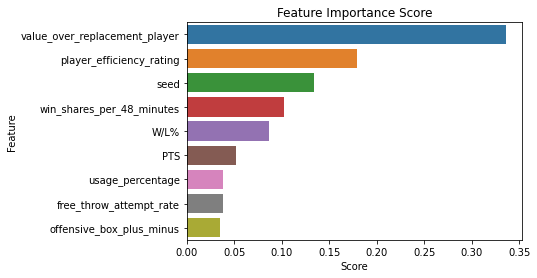

In [56]:
avg_feature_importance(models=rf_models, cols=rf_cols)


XGBoost

In [57]:
xgb_avg_mae, xgb_avg_r2, xgb_accuracy, xgb_summary, xgb_models, xgb_cols = run_model_average(df=master_table,
                  regressor = XGBRegressor(n_estimators=16, max_depth=5, learning_rate = 0.2745, subsample=1, colsample_bytree=1),
                 scaling=False, print_metrics=True)

100%|██████████| 42/42 [00:03<00:00, 13.90it/s]

Average MAE: 0.10327332429727709
Average R squared: 0.6062658034118551
Prediction accuracy: 0.8333333333333334


In [100]:
xgb_summary

,year,MAE,R squared,Predicted MVP,Actual MVP,Label
0,1980,0.068104,0.711039,Kareem Abdul-Jabbar,Kareem Abdul-Jabbar,correct
1,1981,0.044850,0.605227,Julius Erving,Julius Erving,correct
2,1982,0.079323,0.264734,Magic Johnson,Moses Malone,incorrect
3,1983,0.078697,0.458365,Moses Malone,Moses Malone,correct
4,1984,0.089311,0.552824,Larry Bird,Larry Bird,correct
5,1985,0.043589,0.896859,Larry Bird,Larry Bird,correct
6,1986,0.092436,0.706484,Larry Bird,Larry Bird,correct
7,1987,0.071820,0.709262,Magic Johnson,Magic Johnson,correct
8,1988,0.092211,0.652065,Michael Jordan,Michael Jordan,correct
9,1989,0.064810,0.822390,Magic Johnson,Magic Johnson,correct


LightGBM

In [59]:
lgbm_avg_mae, lgbm_avg_r2, lgbm_accuracy, lgbm_summary, lgbm_models, lgbm_cols = run_model_average(df=master_table,
                  regressor = LGBMRegressor(n_estimators=23,
                                            max_depth=4,
                                            learning_rate=0.15,
                                            num_leaves=28,
                                            boosting_type='goss',
                                            random_state = 0,
                                           ),
                 scaling=False, print_metrics=True)

100%|██████████| 42/42 [00:01<00:00, 31.41it/s]

Average MAE: 0.10605503800455611
Average R squared: 0.6119918538779787
Prediction accuracy: 0.7619047619047619


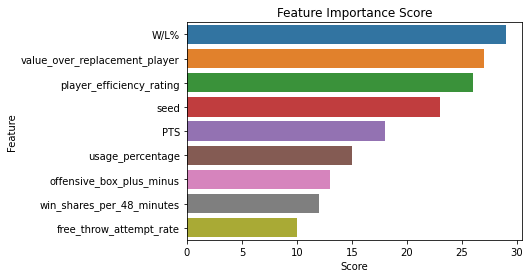

In [60]:
avg_feature_importance(models=lgbm_models, cols=lgbm_cols)

Model summary

In [61]:
d = {
    'Model': ['Linear Regression', 'Random Forest Regressor', 'XGBoost Regressor', 'LGBM Regressor'],
    'average MAE': [lr_avg_mae,rf_avg_mae, xgb_avg_mae, lgbm_avg_mae],
    'average R squared': [lr_avg_r2,rf_avg_r2, xgb_avg_r2, lgbm_avg_r2],
    'accuracy': [lr_accuracy,rf_accuracy, xgb_accuracy, lgbm_accuracy],
}
model_summary_df = pd.DataFrame(d)
model_summary_df.style.highlight_max(subset = ['average R squared', 'accuracy'],
                       color = 'lightgreen', axis = 0)

,Model,average MAE,average R squared,accuracy
0,Linear Regression,0.145281,0.471695,0.642857
1,Random Forest Regressor,0.103997,0.608810,0.738095
2,XGBoost Regressor,0.103273,0.606266,0.833333
3,LGBM Regressor,0.106055,0.611992,0.761905


In [62]:
best_xgb_model = xgb_models[0]
best_rf_model = rf_models[0]
best_lgbm_model = lgbm_models[0]
best_lgbm_model

LGBMRegressor(boosting_type='goss', learning_rate=0.15, max_depth=4,
              n_estimators=23, num_leaves=28, random_state=0)

In [63]:
def validate_year(year):
    X_train, y_train, X_test, y_test, cols = train_test_split_by_year(year, df=master_table, scaling=False)
    model, mae, r2, predicted_winner, actual_winner, mvp_race = run_model(best_xgb_model,
                                              X_train, y_train, X_test, y_test, df=master_table, year=year)
    # shift column 'Name' to first position
    nineth_column = mvp_race.pop('predicted_share')
    # first_column) function
    mvp_race.insert(8, 'predicted_share', nineth_column)
    mvp_race = mvp_race.reset_index(drop=True)

    X_test_df = pd.DataFrame(columns=cols, data = X_test)
    
    print(f'Predicted: {predicted_winner}')
    print(f'Actual: {actual_winner}')
    avg_feature_importance(models=[model], cols=cols)   
    return model, X_test_df, mvp_race #mvp_race.style.highlight_max(subset = ['Share', 'predicted_share'], color = 'lightgreen', axis = 0)

In [64]:
def visualize_shap_values(mvp_race, model):
    top_candidates = list(mvp_race.head(3)['Player'])

    for idx, player in enumerate(top_candidates):
        data_for_prediction = mvp_race[mvp_race['Player'] == player]
        data_for_prediction = data_for_prediction[list(xgb_cols)]
        data_for_prediction_array = data_for_prediction.values.reshape(1, -1)
        rank = idx + 1
        #print(f"Rank: {rank}: {mvp_race.iloc[row_to_show]['Player']}")
        print(f"Rank: {rank}: {player}")

        # Create object that can calculate shap values
        explainer = shap.TreeExplainer(model)
        # Calculate Shap values
        shap_values = explainer.shap_values(data_for_prediction_array)
        shap.initjs()
        display(shap.force_plot(explainer.expected_value, shap_values, data_for_prediction))

Predicted: Stephen Curry
Actual: Stephen Curry


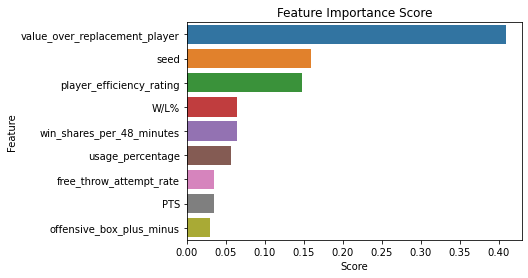

In [65]:


model, X_test_df, mvp_race = validate_year(year=2015)



In [66]:
shap.initjs()

visualize_shap_values(mvp_race, model)

Rank: 1: Stephen Curry


Rank: 2: James Harden


Rank: 3: LeBron James


In [67]:

data_2022 = pd.read_csv(r'C:\Users\KY PHUOC\Downloads\data_2022.csv')
data_2022_cleaned = data_2022.copy()
data_2022_cleaned = data_2022_cleaned[list(xgb_cols)]

In [68]:
data_2022_cleaned

,PTS,W/L%,seed,player_efficiency_rating,free_throw_attempt_rate,usage_percentage,win_shares_per_48_minutes,offensive_box_plus_minus,value_over_replacement_player
0,28.484848,0.619,1.5,32.0,0.573,34.8,0.288,7.3,8.696970
1,26.833333,0.769,1.5,22.1,0.232,32.6,0.191,6.2,6.605556
2,26.352941,0.703,1.5,23.0,0.401,31.2,0.174,3.1,3.135294
3,29.878788,0.658,3.5,25.6,0.337,31.6,0.207,6.3,6.957576
4,26.814815,0.579,5.5,28.9,0.580,34.6,0.227,5.9,6.377778
5,15.513514,0.700,3.5,25.2,0.871,16.8,0.277,3.2,4.875676
6,28.896552,0.512,6.0,27.4,0.275,30.5,0.221,7.1,8.200000
7,25.848485,0.526,8.0,32.4,0.300,32.6,0.275,8.9,10.436364
8,24.724138,0.667,3.5,25.2,0.333,31.9,0.184,6.3,5.372414
9,13.974359,0.769,1.5,20.2,0.275,19.6,0.206,2.4,4.205128


In [69]:
def prep_train_test(df):
    #train; using hitorical data from 1980 - 2021
    forecast_X_train_df = df.copy()
    forecast_X_train_df.drop(to_drop, axis=1, inplace=True)
    forecast_y_train_df = forecast_X_train_df['Share']
    forecast_X_train_df.drop(['Share'], axis=1, inplace=True)
    
    #data to be forecasted: 2022 mvp candidates from NBA's MVP ladder
    forecast_X_test_df = data_2022_cleaned
    
    print(f'Training dataset columns: \n{list(forecast_X_train_df.columns)} \n')
    print(f'Forecasting dataset columns: \n{list(forecast_X_test_df.columns)}')
    return forecast_X_train_df, forecast_y_train_df, forecast_X_test_df

In [70]:
def fit_forecast_model(regressor):
    model = regressor
    model.fit(forecast_X_train_df, forecast_y_train_df) 
    predictions = model.predict(forecast_X_test_df)
    
    mvp_race_forecast = data_2022.copy()
    mvp_race_forecast['Share Prediction'] = predictions
    mvp_race_forecast = mvp_race_forecast.sort_values(["Share Prediction"], ascending = (False))
    
    mvp_race_forecast_sub = mvp_race_forecast[[
                                                'Player',
                                                'Share Prediction',
                                                'PTS',
                                               'value_over_replacement_player',
                                               'seed',
                                                'W/L%',
                                               'player_efficiency_rating',
                                               'win_shares_per_48_minutes',
                                                'offensive_box_plus_minus',
                                                'usage_percentage',
                                            'free_throw_attempt_rate'
                                              ]].reset_index(drop=True)
    mvp_race_forecast_sub.head()
    avg_feature_importance(models=[model], cols=data_2022_cleaned.columns)
    return model, mvp_race_forecast_sub

In [71]:
def show_highlighted_df(df):
    return df.style.highlight_max(subset = ['value_over_replacement_player',
                                                    'player_efficiency_rating',
                                                    'W/L%',
                                                    'win_shares_per_48_minutes',
                                                    'usage_percentage',
                                                    'free_throw_attempt_rate',
                                                    'offensive_box_plus_minus',
                                                    'PTS',
                                                    'Share Prediction'], color = 'lightgreen', axis = 0)

In [72]:
forecast_X_train_df, forecast_y_train_df, forecast_X_test_df = prep_train_test(df=master_table)

Training dataset columns: 
['PTS', 'W/L%', 'seed', 'player_efficiency_rating', 'free_throw_attempt_rate', 'usage_percentage', 'win_shares_per_48_minutes', 'offensive_box_plus_minus', 'value_over_replacement_player'] 

Forecasting dataset columns: 
['PTS', 'W/L%', 'seed', 'player_efficiency_rating', 'free_throw_attempt_rate', 'usage_percentage', 'win_shares_per_48_minutes', 'offensive_box_plus_minus', 'value_over_replacement_player']


In [73]:
best_xgb_model

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.2745, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=16, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

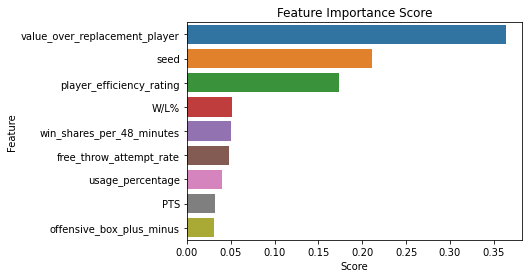

In [74]:
xgb_model, xgb_mvp_race_forecast = fit_forecast_model(regressor = XGBRegressor(
                                            n_estimators=16,
                                            max_depth=5,
                                            learning_rate=0.2745))

In [75]:
show_highlighted_df(df=xgb_mvp_race_forecast)

,Player,Share Prediction,PTS,value_over_replacement_player,seed,W/L%,player_efficiency_rating,win_shares_per_48_minutes,offensive_box_plus_minus,usage_percentage,free_throw_attempt_rate
0,Giannis Antetokounmpo,0.742691,28.484848,8.696970,1.500000,0.619000,32.000000,0.288000,7.300000,34.800000,0.573000
1,Stephen Curry,0.442170,26.833333,6.605556,1.500000,0.769000,22.100000,0.191000,6.200000,32.600000,0.232000
2,Kevin Durant,0.346930,29.878788,6.957576,3.500000,0.658000,25.600000,0.207000,6.300000,31.600000,0.337000
3,Rudy Gobert,0.311632,15.513514,4.875676,3.500000,0.700000,25.200000,0.277000,3.200000,16.800000,0.871000
4,Joel Embiid,0.277227,26.814815,6.377778,5.500000,0.579000,28.900000,0.227000,5.900000,34.600000,0.580000
5,LeBron James,0.274318,28.896552,8.200000,6.000000,0.512000,27.400000,0.221000,7.100000,30.500000,0.275000
6,DeMar DeRozan,0.239093,26.352941,3.135294,1.500000,0.703000,23.000000,0.174000,3.100000,31.200000,0.401000
7,Ja Morant,0.215512,24.724138,5.372414,3.500000,0.667000,25.200000,0.184000,6.300000,31.900000,0.333000
8,Nikola Jokic,0.163917,25.848485,10.436364,8.000000,0.526000,32.400000,0.275000,8.900000,32.600000,0.300000
9,Chris Paul,0.120570,13.974359,4.205128,1.500000,0.769000,20.200000,0.206000,2.400000,19.600000,0.275000


In [76]:
visualize_shap_values(model= xgb_model, mvp_race=xgb_mvp_race_forecast)

Rank: 1: Giannis Antetokounmpo


Rank: 2: Stephen Curry


Rank: 3: Kevin Durant


In [77]:
best_rf_model

RandomForestRegressor(max_depth=7, n_estimators=23, random_state=0)

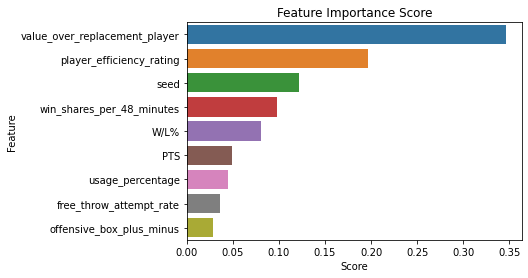

In [78]:
rf_model, rf_mvp_race_forecast = fit_forecast_model(regressor = RandomForestRegressor(n_estimators = 23, 
                                                  random_state = 0, 
                                                  max_depth=7, 
                                                  min_samples_leaf=1,
                                                  min_samples_split=2)
                  )

In [79]:
show_highlighted_df(df=rf_mvp_race_forecast)

,Player,Share Prediction,PTS,value_over_replacement_player,seed,W/L%,player_efficiency_rating,win_shares_per_48_minutes,offensive_box_plus_minus,usage_percentage,free_throw_attempt_rate
0,Giannis Antetokounmpo,0.684152,28.484848,8.696970,1.500000,0.619000,32.000000,0.288000,7.300000,34.800000,0.573000
1,Stephen Curry,0.417053,26.833333,6.605556,1.500000,0.769000,22.100000,0.191000,6.200000,32.600000,0.232000
2,LeBron James,0.378229,28.896552,8.200000,6.000000,0.512000,27.400000,0.221000,7.100000,30.500000,0.275000
3,Nikola Jokic,0.360993,25.848485,10.436364,8.000000,0.526000,32.400000,0.275000,8.900000,32.600000,0.300000
4,Kevin Durant,0.319538,29.878788,6.957576,3.500000,0.658000,25.600000,0.207000,6.300000,31.600000,0.337000
5,Rudy Gobert,0.231895,15.513514,4.875676,3.500000,0.700000,25.200000,0.277000,3.200000,16.800000,0.871000
6,DeMar DeRozan,0.206935,26.352941,3.135294,1.500000,0.703000,23.000000,0.174000,3.100000,31.200000,0.401000
7,Joel Embiid,0.178143,26.814815,6.377778,5.500000,0.579000,28.900000,0.227000,5.900000,34.600000,0.580000
8,Ja Morant,0.153355,24.724138,5.372414,3.500000,0.667000,25.200000,0.184000,6.300000,31.900000,0.333000
9,Chris Paul,0.033511,13.974359,4.205128,1.500000,0.769000,20.200000,0.206000,2.400000,19.600000,0.275000


In [80]:
visualize_shap_values(model = rf_model, mvp_race= rf_mvp_race_forecast)

Rank: 1: Giannis Antetokounmpo


Rank: 2: Stephen Curry


Rank: 3: LeBron James


In [81]:
best_lgbm_model

LGBMRegressor(boosting_type='goss', learning_rate=0.15, max_depth=4,
              n_estimators=23, num_leaves=28, random_state=0)

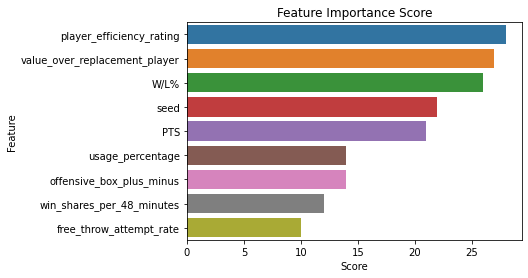

In [82]:
lgbm_model, lgbm_mvp_race_forecast = fit_forecast_model(
                                                regressor = LGBMRegressor(
                                                                    n_estimators=23,
                                                                    max_depth=4,
                                                                    learning_rate=0.15,
                                                                    num_leaves=28,
                                                                    boosting_type='goss',
                                                                    random_state = 0,
                                           ))

In [83]:
show_highlighted_df(df=lgbm_mvp_race_forecast)

,Player,Share Prediction,PTS,value_over_replacement_player,seed,W/L%,player_efficiency_rating,win_shares_per_48_minutes,offensive_box_plus_minus,usage_percentage,free_throw_attempt_rate
0,Giannis Antetokounmpo,0.598864,28.484848,8.696970,1.500000,0.619000,32.000000,0.288000,7.300000,34.800000,0.573000
1,Nikola Jokic,0.555140,25.848485,10.436364,8.000000,0.526000,32.400000,0.275000,8.900000,32.600000,0.300000
2,Stephen Curry,0.470752,26.833333,6.605556,1.500000,0.769000,22.100000,0.191000,6.200000,32.600000,0.232000
3,LeBron James,0.442188,28.896552,8.200000,6.000000,0.512000,27.400000,0.221000,7.100000,30.500000,0.275000
4,Kevin Durant,0.315462,29.878788,6.957576,3.500000,0.658000,25.600000,0.207000,6.300000,31.600000,0.337000
5,Ja Morant,0.219071,24.724138,5.372414,3.500000,0.667000,25.200000,0.184000,6.300000,31.900000,0.333000
6,Joel Embiid,0.211099,26.814815,6.377778,5.500000,0.579000,28.900000,0.227000,5.900000,34.600000,0.580000
7,Rudy Gobert,0.186909,15.513514,4.875676,3.500000,0.700000,25.200000,0.277000,3.200000,16.800000,0.871000
8,DeMar DeRozan,0.118419,26.352941,3.135294,1.500000,0.703000,23.000000,0.174000,3.100000,31.200000,0.401000
9,Chris Paul,0.058108,13.974359,4.205128,1.500000,0.769000,20.200000,0.206000,2.400000,19.600000,0.275000


In [84]:


visualize_shap_values(model = lgbm_model, mvp_race= lgbm_mvp_race_forecast)



Rank: 1: Giannis Antetokounmpo


Rank: 2: Nikola Jokic


Rank: 3: Stephen Curry


In [85]:


forecast_tables = [xgb_mvp_race_forecast, lgbm_mvp_race_forecast, rf_mvp_race_forecast]
model_names = ['XGBoost', 'LightGBM', 'Random Forest']

tables = []
for name, forecast_table in zip(model_names, forecast_tables):
    player_sub = forecast_table.head(5)[['Player']]
    player_sub['Rank'] = ['1st Place','2nd Place','3rd Place','4th Place','5th Place']
    player_sub2 = player_sub.T.reset_index(drop=True)
    player_sub2.columns = player_sub2.iloc[1]
    player_sub2.drop(player_sub2.tail(1).index,inplace=True)

    share_sub = forecast_table.head(5)[['Share Prediction']]
    share_sub['Rank'] = ['1st Place Share','2nd Place Share','3rd Place Share', '4th Place Share', '5th Place Share']
    
    share_sub2 = share_sub.T.reset_index(drop=True)
    share_sub2.columns = share_sub2.iloc[1]
    share_sub2.drop(share_sub2.tail(1).index,inplace=True)

    merged_df = pd.concat([player_sub2, share_sub2], axis=1).sort_index(axis=1)
    merged_df['Model'] = name
    tables.append(merged_df)
    
final_summary_table = pd.concat(tables)
# shift column 'Name' to first position
first_column = final_summary_table.pop('Model')
# first_column) function
final_summary_table.insert(0, 'Model', first_column)



In [86]:


final_summary_table



1,Model,1st Place,1st Place Share,2nd Place,2nd Place Share,3rd Place,3rd Place Share,4th Place,4th Place Share,5th Place,5th Place Share
0,XGBoost,Giannis Antetokounmpo,0.742691,Stephen Curry,0.44217,Kevin Durant,0.34693,Rudy Gobert,0.311632,Joel Embiid,0.277227
0,LightGBM,Giannis Antetokounmpo,0.598864,Nikola Jokic,0.55514,Stephen Curry,0.470752,LeBron James,0.442188,Kevin Durant,0.315462
0,Random Forest,Giannis Antetokounmpo,0.684152,Stephen Curry,0.417053,LeBron James,0.378229,Nikola Jokic,0.360993,Kevin Durant,0.319538
